# Artificial Intelligence Engineer Nanodegree - Probabilistic Models
## Project: Sign Language Recognition System
- [Introduction](#intro)
- [Part 1 Feature Selection](#part1_tutorial)
    - [Tutorial](#part1_tutorial)
    - [Features Submission](#part1_submission)
    - [Features Unittest](#part1_test)
- [Part 2 Train the models](#part2_tutorial)
    - [Tutorial](#part2_tutorial)
    - [Model Selection Score Submission](#part2_submission)
    - [Model Score Unittest](#part2_test)
- [Part 3 Build a Recognizer](#part3_tutorial)
    - [Tutorial](#part3_tutorial)
    - [Recognizer Submission](#part3_submission)
    - [Recognizer Unittest](#part3_test)
- [Part 4 (OPTIONAL) Improve the WER with Language Models](#part4_info)

<a id='intro'></a>
## Introduction
The overall goal of this project is to build a word recognizer for American Sign Language video sequences, demonstrating the power of probabalistic models.  In particular, this project employs  [hidden Markov models (HMM's)](https://en.wikipedia.org/wiki/Hidden_Markov_model) to analyze a series of measurements taken from videos of American Sign Language (ASL) collected for research (see the [RWTH-BOSTON-104 Database](http://www-i6.informatik.rwth-aachen.de/~dreuw/database-rwth-boston-104.php)).  In this video, the right-hand x and y locations are plotted as the speaker signs the sentence.
[![ASLR demo](http://www-i6.informatik.rwth-aachen.de/~dreuw/images/demosample.png)](https://drive.google.com/open?id=0B_5qGuFe-wbhUXRuVnNZVnMtam8)

The raw data, train, and test sets are pre-defined.  You will derive a variety of feature sets (explored in Part 1), as well as implement three different model selection criterion to determine the optimal number of hidden states for each word model (explored in Part 2). Finally, in Part 3 you will implement the recognizer and compare the effects the different combinations of feature sets and model selection criteria.  

At the end of each Part, complete the submission cells with implementations, answer all questions, and pass the unit tests.  Then submit the completed notebook for review!

<a id='part1_tutorial'></a>
## PART 1: Data

### Features Tutorial
##### Load the initial database
A data handler designed for this database is provided in the student codebase as the `AslDb` class in the `asl_data` module.  This handler creates the initial [pandas](http://pandas.pydata.org/pandas-docs/stable/) dataframe from the corpus of data included in the `data` directory as well as dictionaries suitable for extracting data in a format friendly to the [hmmlearn](https://hmmlearn.readthedocs.io/en/latest/) library.  We'll use those to create models in Part 2.

To start, let's set up the initial database and select an example set of features for the training set.  At the end of Part 1, you will create additional feature sets for experimentation. 

In [146]:
import numpy as np
import pandas as pd
from asl_data import AslDb


asl = AslDb() # initializes the database
asl.df.head() # displays the first five rows of the asl database, indexed by video and frame

left-x  left-y  right-x  right-y  nose-x  nose-y  speaker
video frame                                                           
98    0         149     181      170      175     161      62  woman-1
      1         149     181      170      175     161      62  woman-1
      2         149     181      170      175     161      62  woman-1
      3         149     181      170      175     161      62  woman-1
      4         149     181      170      175     161      62  woman-1

In [147]:
asl.df.ix[98,1]  # look at the data available for an individual frame

left-x         149
left-y         181
right-x        170
right-y        175
nose-x         161
nose-y          62
speaker    woman-1
Name: (98, 1), dtype: object

The frame represented by video 98, frame 1 is shown here:
![Video 98](http://www-i6.informatik.rwth-aachen.de/~dreuw/database/rwth-boston-104/overview/images/orig/098-start.jpg)

##### Feature selection for training the model
The objective of feature selection when training a model is to choose the most relevant variables while keeping the model as simple as possible, thus reducing training time.  We can use the raw features already provided or derive our own and add columns to the pandas dataframe `asl.df` for selection. As an example, in the next cell a feature named `'grnd-ry'` is added. This feature is the difference between the right-hand y value and the nose y value, which serves as the "ground" right y value. 

In [148]:
asl.df['grnd-ry'] = asl.df['right-y'] - asl.df['nose-y']
asl.df.head()  # the new feature 'grnd-ry' is now in the frames dictionary

left-x  left-y  right-x  right-y  nose-x  nose-y  speaker  \
video frame                                                              
98    0         149     181      170      175     161      62  woman-1   
      1         149     181      170      175     161      62  woman-1   
      2         149     181      170      175     161      62  woman-1   
      3         149     181      170      175     161      62  woman-1   
      4         149     181      170      175     161      62  woman-1   

             grnd-ry  
video frame           
98    0          113  
      1          113  
      2          113  
      3          113  
      4          113

##### Try it!

In [149]:
from asl_utils import test_features_tryit
# TODO add df columns for 'grnd-rx', 'grnd-ly', 'grnd-lx' representing differences between hand and nose locations
asl.df['grnd-rx'] = asl.df['right-x'] - asl.df['nose-x']
asl.df['grnd-ly'] = asl.df['left-y'] - asl.df['nose-y']
asl.df['grnd-lx'] = asl.df['left-x'] - asl.df['nose-x']
# test the code
test_features_tryit(asl)

asl.df sample


left-x  left-y  right-x  right-y  nose-x  nose-y  speaker  \
video frame                                                              
98    0         149     181      170      175     161      62  woman-1   
      1         149     181      170      175     161      62  woman-1   
      2         149     181      170      175     161      62  woman-1   
      3         149     181      170      175     161      62  woman-1   
      4         149     181      170      175     161      62  woman-1   

             grnd-ry  grnd-rx  grnd-ly  grnd-lx  
video frame                                      
98    0          113        9      119      -12  
      1          113        9      119      -12  
      2          113        9      119      -12  
      3          113        9      119      -12  
      4          113        9      119      -12

In [150]:
# collect the features into a list
features_ground = ['grnd-rx','grnd-ry','grnd-lx','grnd-ly']
 #show a single set of features for a given (video, frame) tuple
[asl.df.ix[98,1][v] for v in features_ground]

[9, 113, -12, 119]

##### Build the training set
Now that we have a feature list defined, we can pass that list to the `build_training` method to collect the features for all the words in the training set.  Each word in the training set has multiple examples from various videos.  Below we can see the unique words that have been loaded into the training set:

In [151]:
training = asl.build_training(features_ground)
print("Training words: {}".format(training.words))

Training words: ['FRANK', 'TEACHER', 'WOMAN', 'TOY1', 'HERE', 'JOHN', 'IX-1P', 'STOLEN', 'FRIEND', 'COAT', 'SOMETHING-ONE', 'FRED', 'SUE', 'VIDEOTAPE', 'MARY', 'BUY1', 'NEXT-WEEK', 'LEAVE', 'SEARCH-FOR', 'WONT', 'VEGETABLE', 'PREFER', 'MOVIE', 'WILL', 'CAN', 'FISH', 'BUT', 'LOVE', 'HAVE', 'EAT', 'BLUE', 'BOX', 'PARTY', 'WHAT', 'BOOK', 'TOMORROW', 'POSS', 'HIT', 'LIKE', 'ARRIVE', 'BUY', 'HOUSE', 'READ', 'CHICKEN', 'VISIT', 'BOY', 'NEW', 'BILL', 'LAST-WEEK', 'LIVE', 'GIVE', 'CORN', 'SELL', 'THROW', 'BROTHER', 'GET', 'CHOCOLATE', 'NAME', 'WHO', 'MOTHER', 'FINISH', 'MAN', 'THINK', 'BROCCOLI', 'SAY-1P', 'CANDY', 'SEE', 'ANN', 'DECIDE', 'TOY', 'GO2', 'BORROW', 'APPLE', 'GO1', 'NOT', 'ALL', 'OLD', 'BREAK-DOWN', 'LEG', 'YESTERDAY', 'NEW-YORK', 'WRITE', 'POTATO', 'GROUP', 'JANA', 'BLAME', 'KNOW', 'HOMEWORK', 'FIND', 'GIVE1', 'CORN1', 'CHINA', 'FUTURE', 'CHICAGO', 'PUTASIDE', 'GIVE2', 'TELL', 'MANY', 'SHOULD', 'SHOOT', 'STUDENT', 'GIRL', 'GIVE3', 'FUTURE1', 'PAST', 'GO', 'SELF', 'SAY', 'IX', 'CA

The training data in `training` is an object of class `WordsData` defined in the `asl_data` module.  in addition to the `words` list, data can be accessed with the `get_all_sequences`, `get_all_Xlengths`, `get_word_sequences`, and `get_word_Xlengths` methods. We need the `get_word_Xlengths` method to train multiple sequences with the `hmmlearn` library.  In the following example, notice that there are two lists; the first is a concatenation of all the sequences(the X portion) and the second is a list of the sequence lengths(the Lengths portion).

In [152]:
training.get_word_Xlengths('CHOCOLATE')

(array([[-11,  48,   7, 120],
        [-11,  48,   8, 109],
        [ -8,  49,  11,  98],
        [ -7,  50,   7,  87],
        [ -4,  54,   7,  77],
        [ -4,  54,   6,  69],
        [ -4,  54,   6,  69],
        [-13,  52,   6,  69],
        [-13,  52,   6,  69],
        [ -8,  51,   6,  69],
        [ -8,  51,   6,  69],
        [ -8,  51,   6,  69],
        [ -8,  51,   6,  69],
        [ -8,  51,   6,  69],
        [-10,  59,   7,  71],
        [-15,  64,   9,  77],
        [-17,  75,  13,  81],
        [ -4,  48,  -4, 113],
        [ -2,  53,  -4, 113],
        [ -4,  55,   2,  98],
        [ -4,  58,   2,  98],
        [ -1,  59,   2,  89],
        [ -1,  59,  -1,  84],
        [ -1,  59,  -1,  84],
        [ -7,  63,  -1,  84],
        [ -7,  63,  -1,  84],
        [ -7,  63,   3,  83],
        [ -7,  63,   3,  83],
        [ -7,  63,   3,  83],
        [ -7,  63,   3,  83],
        [ -7,  63,   3,  83],
        [ -7,  63,   3,  83],
        [ -7,  63,   3,  83],
        [ 

###### More feature sets
So far we have a simple feature set that is enough to get started modeling.  However, we might get better results if we manipulate the raw values a bit more, so we will go ahead and set up some other options now for experimentation later.  For example, we could normalize each speaker's range of motion with grouped statistics using [Pandas stats](http://pandas.pydata.org/pandas-docs/stable/api.html#api-dataframe-stats) functions and [pandas groupby](http://pandas.pydata.org/pandas-docs/stable/generated/pandas.DataFrame.groupby.html).  Below is an example for finding the means of all speaker subgroups.

In [153]:
df_means = asl.df.groupby('speaker').mean()
df_means

,left-x,left-y,right-x,right-y,nose-x,nose-y,grnd-ry,grnd-rx,grnd-ly,grnd-lx
speaker,,,,,,,,,,
man-1,206.248203,218.679449,155.464350,150.371031,175.031756,61.642600,88.728430,-19.567406,157.036848,31.216447
woman-1,164.661438,161.271242,151.017865,117.332462,162.655120,57.245098,60.087364,-11.637255,104.026144,2.006318
woman-2,183.214509,176.527232,156.866295,119.835714,170.318973,58.022098,61.813616,-13.452679,118.505134,12.895536


To select a mean that matches by speaker, use the pandas [map](http://pandas.pydata.org/pandas-docs/stable/generated/pandas.Series.map.html) method:

In [154]:
asl.df['left-x-mean']= asl.df['speaker'].map(df_means['left-x'])
asl.df.head()

left-x  left-y  right-x  right-y  nose-x  nose-y  speaker  \
video frame                                                              
98    0         149     181      170      175     161      62  woman-1   
      1         149     181      170      175     161      62  woman-1   
      2         149     181      170      175     161      62  woman-1   
      3         149     181      170      175     161      62  woman-1   
      4         149     181      170      175     161      62  woman-1   

             grnd-ry  grnd-rx  grnd-ly  grnd-lx  left-x-mean  
video frame                                                   
98    0          113        9      119      -12   164.661438  
      1          113        9      119      -12   164.661438  
      2          113        9      119      -12   164.661438  
      3          113        9      119      -12   164.661438  
      4          113        9      119      -12   164.661438

##### Try it!

In [155]:
from asl_utils import test_std_tryit
# TODO Create a dataframe named `df_std` with standard deviations grouped by speaker

df_std = asl.df.groupby('speaker').std()
df_std

# test the code
test_std_tryit(df_std)

df_std


,left-x,left-y,right-x,right-y,nose-x,nose-y,grnd-ry,grnd-rx,grnd-ly,grnd-lx,left-x-mean
speaker,,,,,,,,,,,
man-1,15.154425,36.328485,18.901917,54.902340,6.654573,5.520045,53.487999,20.269032,36.572749,15.080360,0.0
woman-1,17.573442,26.594521,16.459943,34.667787,3.549392,3.538330,33.972660,16.764706,27.117393,17.328941,0.0
woman-2,15.388711,28.825025,14.890288,39.649111,4.099760,3.416167,39.128572,16.191324,29.320655,15.050938,0.0


<a id='part1_submission'></a>
### Features Implementation Submission
Implement four feature sets and answer the question that follows.
- normalized Cartesian coordinates
    - use *mean* and *standard deviation* statistics and the [standard score](https://en.wikipedia.org/wiki/Standard_score) equation to account for speakers with different heights and arm length
    
- polar coordinates
    - calculate polar coordinates with [Cartesian to polar equations](https://en.wikipedia.org/wiki/Polar_coordinate_system#Converting_between_polar_and_Cartesian_coordinates)
    - use the [np.arctan2](https://docs.scipy.org/doc/numpy-1.10.0/reference/generated/numpy.arctan2.html) function and *swap the x and y axes* to move the $0$ to $2\pi$ discontinuity to 12 o'clock instead of 3 o'clock;  in other words, the normal break in radians value from $0$ to $2\pi$ occurs directly to the left of the speaker's nose, which may be in the signing area and interfere with results.  By swapping the x and y axes, that discontinuity move to directly above the speaker's head, an area not generally used in signing.

- delta difference
    - as described in Thad's lecture, use the difference in values between one frame and the next frames as features
    - pandas [diff method](http://pandas.pydata.org/pandas-docs/stable/generated/pandas.DataFrame.diff.html) and [fillna method](http://pandas.pydata.org/pandas-docs/stable/generated/pandas.DataFrame.fillna.html) will be helpful for this one

- custom features
    - These are your own design; combine techniques used above or come up with something else entirely. We look forward to seeing what you come up with! 
    Some ideas to get you started:
        - normalize using a [feature scaling equation](https://en.wikipedia.org/wiki/Feature_scaling)
        - normalize the polar coordinates
        - adding additional deltas


In [156]:
# TODO add features for normalized by speaker values of left, right, x, y
# Name these 'norm-rx', 'norm-ry', 'norm-lx', and 'norm-ly'
# using Z-score scaling (X-Xmean)/Xstd

#normalised features
features_norm = ['norm-rx', 'norm-ry', 'norm-lx','norm-ly']

# Lets calculate mean for our features here.
mean_left_x  = asl.df['speaker'].map(df_means['left-x'])
mean_left_y  = asl.df['speaker'].map(df_means['left-y'])
mean_right_x = asl.df['speaker'].map(df_means['right-x'])
mean_right_y = asl.df['speaker'].map(df_means['right-y'])


# Lets calculate standard deviation of our features here
std_left_x  = asl.df['speaker'].map(df_std['left-x'])
std_left_y  = asl.df['speaker'].map(df_std['left-y'])
std_right_x = asl.df['speaker'].map(df_std['right-x'])
std_right_y = asl.df['speaker'].map(df_std['right-y'])

# Applying the formula of z-score here
asl.df['norm-lx'] = (asl.df['left-x'] - mean_left_x) / std_left_x
asl.df['norm-ly'] = (asl.df['left-y'] - mean_left_y) / std_left_y
asl.df['norm-rx'] = (asl.df['right-x'] - mean_right_x) / std_right_x
asl.df['norm-ry'] = (asl.df['right-y'] - mean_right_y) / std_right_y

In [157]:
# TODO add features for polar coordinate values where the nose is the origin
# Name these 'polar-rr', 'polar-rtheta', 'polar-lr', and 'polar-ltheta'
# Note that 'polar-rr' and 'polar-rtheta' refer to the radius and angle

features_polar = ['polar-rr', 'polar-rtheta', 'polar-lr', 'polar-ltheta']

# Making nose as origin
grnd_lx = asl.df['grnd-lx']
grnd_ly = asl.df['grnd-ly']
grnd_rx = asl.df['grnd-rx']
grnd_ry = asl.df['grnd-ry']


# Calculating the polar features
asl.df['polar-lr'] = np.hypot(grnd_lx, grnd_ly)
asl.df['polar-ltheta'] = np.arctan2(grnd_lx,grnd_ly)
asl.df['polar-rr'] = np.hypot(grnd_rx, grnd_ry)
asl.df['polar-rtheta'] = np.arctan2(grnd_rx, grnd_ry)

In [158]:
# TODO add features for left, right, x, y differences by one time step, i.e. the "delta" values discussed in the lecture
# Name these 'delta-rx', 'delta-ry', 'delta-lx', and 'delta-ly'

#Finding delta values as told in the lecture and fill the missing values with 0.
asl.df['delta-rx']= asl.df['grnd-rx'].diff().fillna(0)
asl.df['delta-ry']= asl.df['grnd-ry'].diff().fillna(0)
asl.df['delta-lx']= asl.df['grnd-lx'].diff().fillna(0)
asl.df['delta-ly']= asl.df['grnd-ly'].diff().fillna(0)


features_delta = ['delta-rx', 'delta-ry', 'delta-lx', 'delta-ly']

In [159]:
# TODO add features of your own design, which may be a combination of the above or something else
# Name these whatever you would like

# TODO define a list named 'features_custom' for building the training set

features_custom = ['diff-rl-x', 'diff-rl-y']

diff_rl_x = asl.df['right-x'] - asl.df['left-x']
diff_rl_y = asl.df['right-y'] - asl.df['left-y']

asl.df['diff-rl-x'] = (diff_rl_x - diff_rl_x.min())/(diff_rl_x.max() - diff_rl_x.min())
asl.df['diff-rl-y'] = (diff_rl_y - diff_rl_y.min())/(diff_rl_y.max() - diff_rl_y.min())

In [160]:
asl.df.head()

left-x  left-y  right-x  right-y  nose-x  nose-y  speaker  \
video frame                                                              
98    0         149     181      170      175     161      62  woman-1   
      1         149     181      170      175     161      62  woman-1   
      2         149     181      170      175     161      62  woman-1   
      3         149     181      170      175     161      62  woman-1   
      4         149     181      170      175     161      62  woman-1   

             grnd-ry  grnd-rx  grnd-ly    ...        polar-lr  polar-ltheta  \
video frame                               ...                                 
98    0          113        9      119    ...      119.603512     -0.100501   
      1          113        9      119    ...      119.603512     -0.100501   
      2          113        9      119    ...      119.603512     -0.100501   
      3          113        9      119    ...      119.603512     -0.100501   
      4          113        9      119    ...      119.603512     -0.100501   

              polar-rr  polar-rtheta  delta-rx  delta-ry  delta-lx  delta-ly  \
video frame                                                                    
98    0      113.35784      0.079478       0.0       0.0       0.0       0.0   
      1      113.35784      0.079478       0.0       0.0       0.0       0.0   
      2      113.35784      0.079478       0.0       0.0       0.0       0.0   
      3      113.35784      0.079478       0.0       0.0       0.0       0.0   
      4      113.35784      0.079478       0.0       0.0       0.0       0.0   

             diff-rl-x  diff-rl-y  
video frame                        
98    0       0.831715   0.782288  
      1       0.831715   0.782288  
      2       0.831715   0.782288  
      3       0.831715   0.782288  
      4       0.831715   0.782288  

[5 rows x 26 columns]

**Question 1:**  What custom features did you choose for the features_custom set and why?

**Answer 1:**  My custom feature is a simple one.I calculated normalised distance between two hands.I thought it could be a good feature for our feature set because,there are words which can be differentiated with the help of distance between two hands.I normalised the values so that i can get the correct answer no matter if person is old or young.

<a id='part1_test'></a>
### Features Unit Testing
Run the following unit tests as a sanity check on the defined "ground", "norm", "polar", and 'delta"
feature sets.  The test simply looks for some valid values but is not exhaustive.  However, the project should not be submitted if these tests don't pass.

In [161]:
import unittest
# import numpy as np

class TestFeatures(unittest.TestCase):

    def test_features_ground(self):
        sample = (asl.df.ix[98, 1][features_ground]).tolist()
        self.assertEqual(sample, [9, 113, -12, 119])

    def test_features_norm(self):
        sample = (asl.df.ix[98, 1][features_norm]).tolist()
        np.testing.assert_almost_equal(sample, [ 1.153,  1.663, -0.891,  0.742], 3)

    def test_features_polar(self):
        sample = (asl.df.ix[98,1][features_polar]).tolist()
        np.testing.assert_almost_equal(sample, [113.3578, 0.0794, 119.603, -0.1005], 3)

    def test_features_delta(self):
        sample = (asl.df.ix[98, 0][features_delta]).tolist()
        self.assertEqual(sample, [0, 0, 0, 0])
        sample = (asl.df.ix[98, 18][features_delta]).tolist()
        self.assertTrue(sample in [[-16, -5, -2, 4], [-14, -9, 0, 0]], "Sample value found was {}".format(sample))
                         
suite = unittest.TestLoader().loadTestsFromModule(TestFeatures())
unittest.TextTestRunner().run(suite)

....
----------------------------------------------------------------------
Ran 4 tests in 0.019s

OK


<unittest.runner.TextTestResult run=4 errors=0 failures=0>

<a id='part2_tutorial'></a>
## PART 2: Model Selection
### Model Selection Tutorial
The objective of Model Selection is to tune the number of states for each word HMM prior to testing on unseen data.  In this section you will explore three methods: 
- Log likelihood using cross-validation folds (CV)
- Bayesian Information Criterion (BIC)
- Discriminative Information Criterion (DIC) 

##### Train a single word
Now that we have built a training set with sequence data, we can "train" models for each word.  As a simple starting example, we train a single word using Gaussian hidden Markov models (HMM).   By using the `fit` method during training, the [Baum-Welch Expectation-Maximization](https://en.wikipedia.org/wiki/Baum%E2%80%93Welch_algorithm) (EM) algorithm is invoked iteratively to find the best estimate for the model *for the number of hidden states specified* from a group of sample seequences. For this example, we *assume* the correct number of hidden states is 3, but that is just a guess.  How do we know what the "best" number of states for training is?  We will need to find some model selection technique to choose the best parameter.

In [162]:
import warnings
from hmmlearn.hmm import GaussianHMM

def train_a_word(word, num_hidden_states, features):
    
    warnings.filterwarnings("ignore", category=DeprecationWarning)
    training = asl.build_training(features)  
    X, lengths = training.get_word_Xlengths(word)
    model = GaussianHMM(n_components=num_hidden_states, n_iter=1000).fit(X, lengths)
    logL = model.score(X, lengths)
    return model, logL

demoword = 'BOOK'
model, logL = train_a_word(demoword, 3, features_ground)
print("Number of states trained in model for {} is {}".format(demoword, model.n_components))
print("logL = {}".format(logL))

Number of states trained in model for BOOK is 3
logL = -2331.1138127433205


The HMM model has been trained and information can be pulled from the model, including means and variances for each feature and hidden state.  The [log likelihood](http://math.stackexchange.com/questions/892832/why-we-consider-log-likelihood-instead-of-likelihood-in-gaussian-distribution) for any individual sample or group of samples can also be calculated with the `score` method.

In [163]:
def show_model_stats(word, model):
    print("Number of states trained in model for {} is {}".format(word, model.n_components))    
    variance=np.array([np.diag(model.covars_[i]) for i in range(model.n_components)])    
    for i in range(model.n_components):  # for each hidden state
        print("hidden state #{}".format(i))
        print("mean = ", model.means_[i])
        print("variance = ", variance[i])
        print()
    
show_model_stats(demoword, model)

Number of states trained in model for BOOK is 3
hidden state #0
mean =  [-3.46504869 50.66686933 14.02391587 52.04731066]
variance =  [49.12346305 43.04799144 39.35109609 47.24195772]

hidden state #1
mean =  [-11.45300909  94.109178    19.03512475 102.2030162 ]
variance =  [ 77.403668   203.35441965  26.68898447 156.12444034]

hidden state #2
mean =  [-1.12415027 69.44164191 17.02866283 77.7231196 ]
variance =  [19.70434594 16.83041492 30.51552305 11.03678246]



##### Try it!
Experiment by changing the feature set, word, and/or num_hidden_states values in the next cell to see changes in values.  

In [164]:
my_testword = 'CHOCOLATE'
model, logL = train_a_word(my_testword, 4, features_ground) # Experiment here with different parameters
show_model_stats(my_testword, model)
print("logL = {}".format(logL))

Number of states trained in model for CHOCOLATE is 4
hidden state #0
mean =  [-4.93681705 64.73171915  1.62598519 84.91459657]
variance =  [ 6.1617479  28.36616959  5.47102461 13.11696032]

hidden state #1
mean =  [  0.58333258  87.91666611  12.75000001 108.49999882]
variance =  [ 39.4105671   18.74389523   9.85499958 144.41752618]

hidden state #2
mean =  [ -6.37712306  51.09867416   3.64009161 104.46268173]
variance =  [ 10.28220014  12.44316166  27.33390004 106.91029392]

hidden state #3
mean =  [-9.23835975 55.307463    6.92298661 71.30538347]
variance =  [16.30887738 45.97071639  3.76856896 15.98215464]

logL = -565.1243334331182


##### Visualize the hidden states
We can plot the means and variances for each state and feature.  Try varying the number of states trained for the HMM model and examine the variances.  Are there some models that are "better" than others?  How can you tell?  We would like to hear what you think in the classroom online.

In [165]:
%matplotlib inline

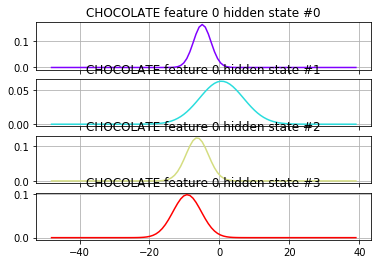

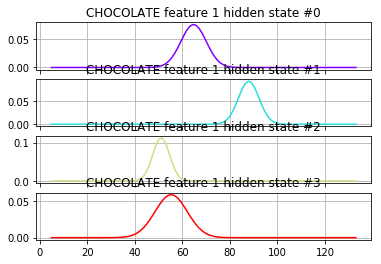

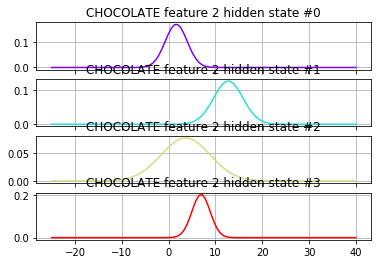

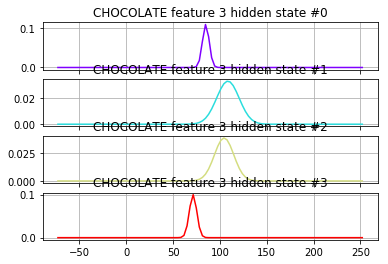

In [166]:
import math
from matplotlib import (cm, pyplot as plt, mlab)

def visualize(word, model):
    """ visualize the input model for a particular word """
    variance=np.array([np.diag(model.covars_[i]) for i in range(model.n_components)])
    figures = []
    for parm_idx in range(len(model.means_[0])):
        xmin = int(min(model.means_[:,parm_idx]) - max(variance[:,parm_idx]))
        xmax = int(max(model.means_[:,parm_idx]) + max(variance[:,parm_idx]))
        fig, axs = plt.subplots(model.n_components, sharex=True, sharey=False)
        colours = cm.rainbow(np.linspace(0, 1, model.n_components))
        for i, (ax, colour) in enumerate(zip(axs, colours)):
            x = np.linspace(xmin, xmax, 100)
            mu = model.means_[i,parm_idx]
            sigma = math.sqrt(np.diag(model.covars_[i])[parm_idx])
            ax.plot(x, mlab.normpdf(x, mu, sigma), c=colour)
            ax.set_title("{} feature {} hidden state #{}".format(word, parm_idx, i))

            ax.grid(True)
        figures.append(plt)
    for p in figures:
        p.show()
        
visualize(my_testword, model)

#####  ModelSelector class
Review the `ModelSelector` class from the codebase found in the `my_model_selectors.py` module.  It is designed to be a strategy pattern for choosing different model selectors.  For the project submission in this section, subclass `SelectorModel` to implement the following model selectors.  In other words, you will write your own classes/functions in the `my_model_selectors.py` module and run them from this notebook:

- `SelectorCV `:  Log likelihood with CV
- `SelectorBIC`: BIC 
- `SelectorDIC`: DIC

You will train each word in the training set with a range of values for the number of hidden states, and then score these alternatives with the model selector, choosing the "best" according to each strategy. The simple case of training with a constant value for `n_components` can be called using the provided `SelectorConstant` subclass as follow:

In [167]:
from my_model_selectors import SelectorConstant

training = asl.build_training(features_norm)  # Experiment here with different feature sets defined in part 1
word = 'NEXT-WEEK' # Experiment here with different words
model = SelectorConstant(training.get_all_sequences(), training.get_all_Xlengths(), word, n_constant=3).select()
print("Number of states trained in model for {} is {}".format(word, model.n_components))

Number of states trained in model for NEXT-WEEK is 3


##### Cross-validation folds
If we simply score the model with the Log Likelihood calculated from the feature sequences it has been trained on, we should expect that more complex models will have higher likelihoods. However, that doesn't tell us which would have a better likelihood score on unseen data.  The model will likely be overfit as complexity is added.  To estimate which topology model is better using only the training data, we can compare scores using cross-validation.  One technique for cross-validation is to break the training set into "folds" and rotate which fold is left out of training.  The "left out" fold scored.  This gives us a proxy method of finding the best model to use on "unseen data". In the following example, a set of word sequences is broken into three folds using the [scikit-learn Kfold](http://scikit-learn.org/stable/modules/generated/sklearn.model_selection.KFold.html) class object. When you implement `SelectorCV`, you will use this technique.

In [168]:
from sklearn.model_selection import KFold

training = asl.build_training(features_norm) # Experiment here with different feature sets
word = 'SOMETHING-ONE' # Experiment here with different words
word_sequences = training.get_word_sequences(word)
split_method = KFold()
for cv_train_idx, cv_test_idx in split_method.split(word_sequences):
    print("Train fold indices:{} Test fold indices:{}".format(cv_train_idx, cv_test_idx))  # view indices of the folds

Train fold indices:[4 5 6 7 8 9] Test fold indices:[0 1 2 3]
Train fold indices:[0 1 2 3 7 8 9] Test fold indices:[4 5 6]
Train fold indices:[0 1 2 3 4 5 6] Test fold indices:[7 8 9]


**Tip:** In order to run `hmmlearn` training using the X,lengths tuples on the new folds, subsets must be combined based on the indices given for the folds.  A helper utility has been provided in the `asl_utils` module named `combine_sequences` for this purpose.

##### Scoring models with other criterion
Scoring model topologies with **BIC** balances fit and complexity within the training set for each word.  In the BIC equation, a penalty term penalizes complexity to avoid overfitting, so that it is not necessary to also use cross-validation in the selection process.  There are a number of references on the internet for this criterion.  These [slides](http://www2.imm.dtu.dk/courses/02433/doc/ch6_slides.pdf) include a formula you may find helpful for your implementation.

The advantages of scoring model topologies with **DIC** over BIC are presented by Alain Biem in this [reference](http://citeseerx.ist.psu.edu/viewdoc/download?doi=10.1.1.58.6208&rep=rep1&type=pdf) (also found [here](https://pdfs.semanticscholar.org/ed3d/7c4a5f607201f3848d4c02dd9ba17c791fc2.pdf)).  DIC scores the discriminant ability of a training set for one word against competing words.  Instead of a penalty term for complexity, it provides a penalty if model liklihoods for non-matching words are too similar to model likelihoods for the correct word in the word set.

<a id='part2_submission'></a>
### Model Selection Implementation Submission
Implement `SelectorCV`, `SelectorBIC`, and `SelectorDIC` classes in the `my_model_selectors.py` module.  Run the selectors on the following five words. Then answer the questions about your results.

**Tip:** The `hmmlearn` library may not be able to train or score all models.  Implement try/except contructs as necessary to eliminate non-viable models from consideration.

In [169]:
words_to_train = ['FISH', 'BOOK', 'VEGETABLE', 'FUTURE', 'JOHN']
import timeit

In [170]:
# autoreload for automatically reloading changes made in my_model_selectors and my_recognizer
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [171]:
# TODO: Implement SelectorCV in my_model_selector.py
from my_model_selectors import SelectorCV

training = asl.build_training(features_ground)  # Experiment here with different feature sets defined in part 1
sequences = training.get_all_sequences()
Xlengths = training.get_all_Xlengths()
for word in words_to_train:
    start = timeit.default_timer()
    model = SelectorCV(sequences, Xlengths, word, 
                    min_n_components=2, max_n_components=15, random_state = 14).select()
    end = timeit.default_timer()-start
    if model is not None:
        print("Training complete for {} with {} states with time {} seconds".format(word, model.n_components, end))
    else:
        print("Training failed for {}".format(word))

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

Training complete for FISH with 3 states with time 0.6728886600176338 seconds


/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

Training complete for BOOK with 3 states with time 3.647549507993972 seconds


/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

Training complete for VEGETABLE with 3 states with time 1.846104928990826 seconds


/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

Training complete for FUTURE with 3 states with time 3.815812451997772 seconds


/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

Training complete for JOHN with 3 states with time 28.144780439004535 seconds


In [172]:
# TODO: Implement SelectorBIC in module my_model_selectors.py
from my_model_selectors import SelectorBIC

training = asl.build_training(features_ground)  # Experiment here with different feature sets defined in part 1
sequences = training.get_all_sequences()
Xlengths = training.get_all_Xlengths()
for word in words_to_train:
    start = timeit.default_timer()
    model = SelectorBIC(sequences, Xlengths, word, 
                    min_n_components=2, max_n_components=15, random_state = 14).select()
    end = timeit.default_timer()-start
    if model is not None:
        print("Training complete for {} with {} states with time {} seconds".format(word, model.n_components, end))
    else:
        print("Training failed for {}".format(word))

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

Training complete for FISH with 3 states with time 0.6683419329929166 seconds


/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

Training complete for BOOK with 3 states with time 2.482189603993902 seconds


/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

Training complete for VEGETABLE with 3 states with time 1.0215573710156605 seconds


/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

Training complete for FUTURE with 3 states with time 2.6891016390000004 seconds


/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

Training complete for JOHN with 3 states with time 24.331514226010768 seconds


In [173]:
# TODO: Implement SelectorDIC in module my_model_selectors.py
from my_model_selectors import SelectorDIC

training = asl.build_training(features_ground)  # Experiment here with different feature sets defined in part 1
sequences = training.get_all_sequences()
Xlengths = training.get_all_Xlengths()
for word in words_to_train:
    start = timeit.default_timer()
    model = SelectorDIC(sequences, Xlengths, word, 
                    min_n_components=2, max_n_components=15, random_state = 14).select()
    end = timeit.default_timer()-start
    if model is not None:
        print("Training complete for {} with {} states with time {} seconds".format(word, model.n_components, end))
    else:
        print("Training failed for {}".format(word))

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),


Training complete for FISH with 3 states with time 1.9659689140098635 seconds


/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

Training complete for BOOK with 3 states with time 5.018259381002281 seconds


/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

Training complete for VEGETABLE with 3 states with time 2.694794269016711 seconds


/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

Training complete for FUTURE with 3 states with time 3.9622246990038548 seconds


/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

Training complete for JOHN with 3 states with time 29.34187106398167 seconds


**Question 2:**  Compare and contrast the possible advantages and disadvantages of the various model selectors implemented.

**Answer 2:**


## BIC ##

### Advantages ## 

* It will both reward high likelihood, but penalizes model complexity.In this way a model will both be a good fit for the data and will also generalize well beyond the data.
* One of BIC’s advantages is that it prefers simpler models.

### Disadvantages ## 

* Sometimes BIC model becomes so simple that it cannot differentiate two different categories.


## DIC ##

### Advantages 

* DIC outperforms BIC in realizing and reducing more than 18% of the relative error rate in it’s inaugural study.
* DIC does better with more states in comparison to BIC.

### Disadvantages 

* DIC has some theoretical limitations, in that its penalty term is invariant to reparameterization, lacks consistency, and isn’t based on a proper predictive criterion.


## CV ##

### Advantages 

* If our dataset contains everything in our selector’s world, it will create the most accurate representation that will predict the best.

### Disadvantages

* cross validation will be incredibly expensive to compute and the slowest selector since it will require running through the data multiple times, over each folds

<a id='part2_test'></a>
### Model Selector Unit Testing
Run the following unit tests as a sanity check on the implemented model selectors.  The test simply looks for valid interfaces  but is not exhaustive. However, the project should not be submitted if these tests don't pass.

In [174]:
from asl_test_model_selectors import TestSelectors
suite = unittest.TestLoader().loadTestsFromModule(TestSelectors())
unittest.TextTestRunner().run(suite)

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

../anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

<unittest.runner.TextTestResult run=4 errors=0 failures=0>

<a id='part3_tutorial'></a>
## PART 3: Recognizer
The objective of this section is to "put it all together".  Using the four feature sets created and the three model selectors, you will experiment with the models and present your results.  Instead of training only five specific words as in the previous section, train the entire set with a feature set and model selector strategy.  
### Recognizer Tutorial
##### Train the full training set
The following example trains the entire set with the example `features_ground` and `SelectorConstant` features and model selector.  Use this pattern for you experimentation and final submission cells.



In [175]:
from my_model_selectors import SelectorConstant

def train_all_words(features, model_selector):
    training = asl.build_training(features)  # Experiment here with different feature sets defined in part 1
    sequences = training.get_all_sequences()
    Xlengths = training.get_all_Xlengths()
    model_dict = {}
    for word in training.words:
        model = model_selector(sequences, Xlengths, word, 
                        n_constant=3).select()
        model_dict[word]=model
    return model_dict

models = train_all_words(features_ground, SelectorConstant)
print("Number of word models returned = {}".format(len(models)))

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log


Number of word models returned = 112


##### Load the test set
The `build_test` method in `ASLdb` is similar to the `build_training` method already presented, but there are a few differences:
- the object is type `SinglesData` 
- the internal dictionary keys are the index of the test word rather than the word itself
- the getter methods are `get_all_sequences`, `get_all_Xlengths`, `get_item_sequences` and `get_item_Xlengths`

In [176]:
test_set = asl.build_test(features_ground)
print("Number of test set items: {}".format(test_set.num_items))
print("Number of test set sentences: {}".format(len(test_set.sentences_index)))

Number of test set items: 178
Number of test set sentences: 40


<a id='part3_submission'></a>
### Recognizer Implementation Submission
For the final project submission, students must implement a recognizer following guidance in the `my_recognizer.py` module.  Experiment with the four feature sets and the three model selection methods (that's 12 possible combinations). You can add and remove cells for experimentation or run the recognizers locally in some other way during your experiments, but retain the results for your discussion.  For submission, you will provide code cells of **only three** interesting combinations for your discussion (see questions below). At least one of these should produce a word error rate of less than 60%, i.e. WER < 0.60 . 

**Tip:** The hmmlearn library may not be able to train or score all models.  Implement try/except contructs as necessary to eliminate non-viable models from consideration.

In [177]:
# TODO implement the recognize method in my_recognizer
from my_recognizer import recognize
from asl_utils import show_errors

In [181]:
# TODO Choose a feature set and model selector
features = features_polar # change as needed
model_selector = SelectorConstant # change as needed

# TODO Recognize the test set and display the result with the show_errors method
models = train_all_words(features, model_selector)
test_set = asl.build_test(features)
probabilities, guesses = recognize(models, test_set)
show_errors(guesses, test_set)

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log



**** WER = 0.6235955056179775
Total correct: 67 out of 178
Video  Recognized                                                    Correct
  100: POSS NEW CAR BREAK-DOWN                                       POSS NEW CAR BREAK-DOWN
    2: *GO *BOOK HOMEWORK                                            JOHN WRITE HOMEWORK
   67: *LIKE *MOTHER NOT BUY HOUSE                                   JOHN FUTURE NOT BUY HOUSE
    7: JOHN *WHAT *MARY *WHAT                                        JOHN CAN GO CAN
  201: JOHN *MAN *MAN *JOHN BUY HOUSE                                JOHN TELL MARY IX-1P BUY HOUSE
   74: *GO *WHO *GO *GO                                              JOHN NOT VISIT MARY
  119: *PREFER *BUY1 IX CAR *SOMETHING-ONE                           SUE BUY IX CAR BLUE
   12: JOHN *WHAT *GO1 CAN                                           JOHN CAN GO CAN
   77: *IX BLAME *LOVE                                               ANN BLAME MARY
  142: *FRANK BUY YESTERDAY WHAT BOOK                 

In [182]:
features = features_polar # change as needed
model_selector = SelectorDIC # change as needed

# TODO Recognize the test set and display the result with the show_errors method
models = train_all_words(features, model_selector)
test_set = asl.build_test(features)
probabilities, guesses = recognize(models, test_set)
show_errors(guesses, test_set)

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log


/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log


/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  


**** WER = 0.6235955056179775
Total correct: 67 out of 178
Video  Recognized                                                    Correct
  100: POSS NEW CAR BREAK-DOWN                                       POSS NEW CAR BREAK-DOWN
    2: *GO *BOOK HOMEWORK                                            JOHN WRITE HOMEWORK
   67: *LIKE *MOTHER NOT BUY HOUSE                                   JOHN FUTURE NOT BUY HOUSE
    7: JOHN *WHAT *MARY *WHAT                                        JOHN CAN GO CAN
  201: JOHN *MAN *MAN *JOHN BUY HOUSE                                JOHN TELL MARY IX-1P BUY HOUSE
   74: *GO *WHO *GO *GO                                              JOHN NOT VISIT MARY
  119: *PREFER *BUY1 IX CAR *SOMETHING-ONE                           SUE BUY IX CAR BLUE
   12: JOHN *WHAT *GO1 CAN                                           JOHN CAN GO CAN
   77: *IX BLAME *LOVE                                               ANN BLAME MARY
  142: *FRANK BUY YESTERDAY WHAT BOOK                 

In [184]:
features = features_polar # change as needed
model_selector = SelectorBIC # change as needed

# TODO Recognize the test set and display the result with the show_errors method
models = train_all_words(features, model_selector)
test_set = asl.build_test(features)
probabilities, guesses = recognize(models, test_set)
show_errors(guesses, test_set)

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log


/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log


/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np


**** WER = 0.6235955056179775
Total correct: 67 out of 178
Video  Recognized                                                    Correct
  100: POSS NEW CAR BREAK-DOWN                                       POSS NEW CAR BREAK-DOWN
    2: *GO *BOOK HOMEWORK                                            JOHN WRITE HOMEWORK
   67: *LIKE *MOTHER NOT BUY HOUSE                                   JOHN FUTURE NOT BUY HOUSE
    7: JOHN *WHAT *MARY *WHAT                                        JOHN CAN GO CAN
  201: JOHN *MAN *MAN *JOHN BUY HOUSE                                JOHN TELL MARY IX-1P BUY HOUSE
   74: *GO *WHO *GO *GO                                              JOHN NOT VISIT MARY
  119: *PREFER *BUY1 IX CAR *SOMETHING-ONE                           SUE BUY IX CAR BLUE
   12: JOHN *WHAT *GO1 CAN                                           JOHN CAN GO CAN
   77: *IX BLAME *LOVE                                               ANN BLAME MARY
  142: *FRANK BUY YESTERDAY WHAT BOOK                 

In [185]:
features = features_polar # change as needed
model_selector = SelectorCV # change as needed

# TODO Recognize the test set and display the result with the show_errors method
models = train_all_words(features, model_selector)
test_set = asl.build_test(features)
probabilities, guesses = recognize(models, test_set)
show_errors(guesses, test_set)

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log


/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log


/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log


/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in lo

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log


/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log


/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  


**** WER = 0.6460674157303371
Total correct: 63 out of 178
Video  Recognized                                                    Correct
  100: POSS NEW CAR BREAK-DOWN                                       POSS NEW CAR BREAK-DOWN
    2: *MARY *VIDEOTAPE HOMEWORK                                     JOHN WRITE HOMEWORK
   67: *LIKE FUTURE *MARY BUY HOUSE                                  JOHN FUTURE NOT BUY HOUSE
    7: JOHN *BOX *JOHN *ARRIVE                                       JOHN CAN GO CAN
  201: JOHN *MAN *MAN *JOHN BUY *TEACHER                             JOHN TELL MARY IX-1P BUY HOUSE
   74: *IX *MARY *MARY *IX                                           JOHN NOT VISIT MARY
  119: *VEGETABLE *BUY1 IX *BLAME *POSS                              SUE BUY IX CAR BLUE
   12: JOHN *WHAT *WHAT *HOUSE                                       JOHN CAN GO CAN
   77: *JOHN *GIVE1 *LOVE                                            ANN BLAME MARY
  142: JOHN BUY YESTERDAY WHAT BOOK                   

In [186]:
features = features_norm # change as needed
model_selector = SelectorCV # change as needed

# TODO Recognize the test set and display the result with the show_errors method
models = train_all_words(features, model_selector)
test_set = asl.build_test(features)
probabilities, guesses = recognize(models, test_set)
show_errors(guesses, test_set)

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in lo

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in lo

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in lo

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in lo

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in lo

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  


**** WER = 0.6292134831460674
Total correct: 66 out of 178
Video  Recognized                                                    Correct
  100: POSS NEW CAR BREAK-DOWN                                       POSS NEW CAR BREAK-DOWN
    2: *VISIT WRITE *ARRIVE                                          JOHN WRITE HOMEWORK
   67: *SHOOT FUTURE *SOMETHING-ONE *ARRIVE HOUSE                    JOHN FUTURE NOT BUY HOUSE
    7: *IX *NEW *JOHN *ARRIVE                                        JOHN CAN GO CAN
  201: JOHN *THINK *WOMAN *WOMAN *ARRIVE HOUSE                       JOHN TELL MARY IX-1P BUY HOUSE
   74: *WOMAN *BILL *WOMAN *WOMAN                                    JOHN NOT VISIT MARY
  119: *VEGETABLE *BUY1 *CAR CAR *FINISH                             SUE BUY IX CAR BLUE
   12: *MARY *WHAT *WHAT CAN                                         JOHN CAN GO CAN
   77: ANN *ARRIVE MARY                                              ANN BLAME MARY
  142: JOHN BUY YESTERDAY WHAT BOOK                   

In [187]:
features = features_norm # change as needed
model_selector = SelectorDIC # change as needed

# TODO Recognize the test set and display the result with the show_errors method
models = train_all_words(features, model_selector)
test_set = asl.build_test(features)
probabilities, guesses = recognize(models, test_set)
show_errors(guesses, test_set)

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in lo

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log


/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log


/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 


**** WER = 0.6235955056179775
Total correct: 67 out of 178
Video  Recognized                                                    Correct
  100: POSS NEW CAR BREAK-DOWN                                       POSS NEW CAR BREAK-DOWN
    2: *MARY WRITE *ARRIVE                                           JOHN WRITE HOMEWORK
   67: *IX-1P FUTURE *JOHN *ARRIVE HOUSE                             JOHN FUTURE NOT BUY HOUSE
    7: JOHN *NEW *JOHN CAN                                           JOHN CAN GO CAN
  201: JOHN *THINK *WOMAN *WOMAN *STUDENT HOUSE                      JOHN TELL MARY IX-1P BUY HOUSE
   74: *WOMAN *VISIT VISIT *FRANK                                    JOHN NOT VISIT MARY
  119: *VEGETABLE *BUY1 IX CAR *GO                                   SUE BUY IX CAR BLUE
   12: *SHOULD *HAVE *GO1 CAN                                        JOHN CAN GO CAN
   77: *IX BLAME MARY                                                ANN BLAME MARY
  142: JOHN BUY YESTERDAY WHAT BOOK                   

In [188]:
features = features_norm # change as needed
model_selector = SelectorBIC # change as needed

# TODO Recognize the test set and display the result with the show_errors method
models = train_all_words(features, model_selector)
test_set = asl.build_test(features)
probabilities, guesses = recognize(models, test_set)
show_errors(guesses, test_set)

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log


/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log


/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log


/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log


/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 


**** WER = 0.6235955056179775
Total correct: 67 out of 178
Video  Recognized                                                    Correct
  100: POSS NEW CAR BREAK-DOWN                                       POSS NEW CAR BREAK-DOWN
    2: *MARY WRITE *ARRIVE                                           JOHN WRITE HOMEWORK
   67: *IX-1P FUTURE *JOHN *ARRIVE HOUSE                             JOHN FUTURE NOT BUY HOUSE
    7: JOHN *NEW *JOHN CAN                                           JOHN CAN GO CAN
  201: JOHN *THINK *WOMAN *WOMAN *STUDENT HOUSE                      JOHN TELL MARY IX-1P BUY HOUSE
   74: *WOMAN *VISIT VISIT *FRANK                                    JOHN NOT VISIT MARY
  119: *VEGETABLE *BUY1 IX CAR *GO                                   SUE BUY IX CAR BLUE
   12: *SHOULD *HAVE *GO1 CAN                                        JOHN CAN GO CAN
   77: *IX BLAME MARY                                                ANN BLAME MARY
  142: JOHN BUY YESTERDAY WHAT BOOK                   

In [189]:
features = features_norm # change as needed
model_selector = SelectorCV # change as needed

# TODO Recognize the test set and display the result with the show_errors method
models = train_all_words(features, model_selector)
test_set = asl.build_test(features)
probabilities, guesses = recognize(models, test_set)
show_errors(guesses, test_set)

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in lo

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in lo

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log


/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in lo

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log


/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 


**** WER = 0.6292134831460674
Total correct: 66 out of 178
Video  Recognized                                                    Correct
  100: POSS NEW CAR BREAK-DOWN                                       POSS NEW CAR BREAK-DOWN
    2: *VISIT WRITE *ARRIVE                                          JOHN WRITE HOMEWORK
   67: *SHOOT FUTURE *SOMETHING-ONE *ARRIVE HOUSE                    JOHN FUTURE NOT BUY HOUSE
    7: *IX *NEW *JOHN *ARRIVE                                        JOHN CAN GO CAN
  201: JOHN *THINK *WOMAN *WOMAN *ARRIVE HOUSE                       JOHN TELL MARY IX-1P BUY HOUSE
   74: *WOMAN *BILL *WOMAN *WOMAN                                    JOHN NOT VISIT MARY
  119: *VEGETABLE *BUY1 *CAR CAR *FINISH                             SUE BUY IX CAR BLUE
   12: *MARY *WHAT *WHAT CAN                                         JOHN CAN GO CAN
   77: ANN *ARRIVE MARY                                              ANN BLAME MARY
  142: JOHN BUY YESTERDAY WHAT BOOK                   

In [190]:
features = features_delta # change as needed
model_selector = SelectorCV # change as needed

# TODO Recognize the test set and display the result with the show_errors method
models = train_all_words(features, model_selector)
test_set = asl.build_test(features)
probabilities, guesses = recognize(models, test_set)
show_errors(guesses, test_set)

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in lo

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in lo

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in lo

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in lo

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 


**** WER = 0.7584269662921348
Total correct: 43 out of 178
Video  Recognized                                                    Correct
  100: *IX NEW *WHAT BREAK-DOWN                                      POSS NEW CAR BREAK-DOWN
    2: *IX *IX HOMEWORK                                              JOHN WRITE HOMEWORK
   67: *IX *IX *HOMEWORK BUY HOUSE                                   JOHN FUTURE NOT BUY HOUSE
    7: *MARY *PEOPLE *GIVE1 *TEACHER                                 JOHN CAN GO CAN
  201: *IX *MARY *WHO *GIRL *GO HOUSE                                JOHN TELL MARY IX-1P BUY HOUSE
   74: *IX *IX *IX *IX                                               JOHN NOT VISIT MARY
  119: *MARY *GIVE1 *GIVE1 CAR *HAVE                                 SUE BUY IX CAR BLUE
   12: *IX CAN *HOUSE CAN                                            JOHN CAN GO CAN
   77: *IX *GIVE1 MARY                                               ANN BLAME MARY
  142: *IX BUY *MARY *MARY *IX                        

In [191]:
features = features_delta # change as needed
model_selector = SelectorDIC # change as needed

# TODO Recognize the test set and display the result with the show_errors method
models = train_all_words(features, model_selector)
test_set = asl.build_test(features)
probabilities, guesses = recognize(models, test_set)
show_errors(guesses, test_set)

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log


/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log


/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in lo

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log


/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in lo

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log


/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in lo

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in lo

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 


**** WER = 0.6292134831460674
Total correct: 66 out of 178
Video  Recognized                                                    Correct
  100: *JOHN NEW *WHAT BREAK-DOWN                                    POSS NEW CAR BREAK-DOWN
    2: JOHN *IX HOMEWORK                                             JOHN WRITE HOMEWORK
   67: JOHN *JOHN *PEOPLE BUY HOUSE                                  JOHN FUTURE NOT BUY HOUSE
    7: JOHN *HAVE *GIVE1 *TEACHER                                    JOHN CAN GO CAN
  201: JOHN *MARY *WHO *POSS *VISIT HOUSE                            JOHN TELL MARY IX-1P BUY HOUSE
   74: JOHN *JOHN *IX *JOHN                                          JOHN NOT VISIT MARY
  119: *MARY *BUY1 *GIVE1 CAR *HAVE                                  SUE BUY IX CAR BLUE
   12: JOHN CAN *GO1 CAN                                             JOHN CAN GO CAN
   77: *JOHN BLAME MARY                                              ANN BLAME MARY
  142: JOHN BUY *MARY *MARY *EAT                      

In [192]:
features = features_delta # change as needed
model_selector = SelectorBIC # change as needed

# TODO Recognize the test set and display the result with the show_errors method
models = train_all_words(features, model_selector)
test_set = asl.build_test(features)
probabilities, guesses = recognize(models, test_set)
show_errors(guesses, test_set)

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log


/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in lo

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in lo

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log


/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log


/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log


/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in lo

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in lo

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 


**** WER = 0.6292134831460674
Total correct: 66 out of 178
Video  Recognized                                                    Correct
  100: *JOHN NEW *WHAT BREAK-DOWN                                    POSS NEW CAR BREAK-DOWN
    2: JOHN *IX HOMEWORK                                             JOHN WRITE HOMEWORK
   67: JOHN *JOHN *PEOPLE BUY HOUSE                                  JOHN FUTURE NOT BUY HOUSE
    7: JOHN *HAVE *GIVE1 *TEACHER                                    JOHN CAN GO CAN
  201: JOHN *MARY *WHO *POSS *VISIT HOUSE                            JOHN TELL MARY IX-1P BUY HOUSE
   74: JOHN *JOHN *IX *JOHN                                          JOHN NOT VISIT MARY
  119: *MARY *BUY1 *GIVE1 CAR *HAVE                                  SUE BUY IX CAR BLUE
   12: JOHN CAN *GO1 CAN                                             JOHN CAN GO CAN
   77: *JOHN BLAME MARY                                              ANN BLAME MARY
  142: JOHN BUY *MARY *MARY *EAT                      

In [193]:
features = features_delta # change as needed
model_selector = SelectorCV # change as needed

# TODO Recognize the test set and display the result with the show_errors method
models = train_all_words(features, model_selector)
test_set = asl.build_test(features)
probabilities, guesses = recognize(models, test_set)
show_errors(guesses, test_set)

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in lo

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in lo

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in lo

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log


/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log


/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 


**** WER = 0.7584269662921348
Total correct: 43 out of 178
Video  Recognized                                                    Correct
  100: *IX NEW *WHAT BREAK-DOWN                                      POSS NEW CAR BREAK-DOWN
    2: *IX *IX HOMEWORK                                              JOHN WRITE HOMEWORK
   67: *IX *IX *HOMEWORK BUY HOUSE                                   JOHN FUTURE NOT BUY HOUSE
    7: *MARY *PEOPLE *GIVE1 *TEACHER                                 JOHN CAN GO CAN
  201: *IX *MARY *WHO *GIRL *GO HOUSE                                JOHN TELL MARY IX-1P BUY HOUSE
   74: *IX *IX *IX *IX                                               JOHN NOT VISIT MARY
  119: *MARY *GIVE1 *GIVE1 CAR *HAVE                                 SUE BUY IX CAR BLUE
   12: *IX CAN *HOUSE CAN                                            JOHN CAN GO CAN
   77: *IX *GIVE1 MARY                                               ANN BLAME MARY
  142: *IX BUY *MARY *MARY *IX                        

In [195]:
features = features_ground # change as needed
model_selector = SelectorCV # change as needed

# TODO Recognize the test set and display the result with the show_errors method
models = train_all_words(features, model_selector)
test_set = asl.build_test(features)
probabilities, guesses = recognize(models, test_set)
show_errors(guesses, test_set)

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log


/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log


/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in lo

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 


**** WER = 0.6741573033707865
Total correct: 58 out of 178
Video  Recognized                                                    Correct
  100: POSS NEW *GIVE1 *COAT                                         POSS NEW CAR BREAK-DOWN
    2: *WHO *BOOK *ARRIVE                                            JOHN WRITE HOMEWORK
   67: *LIKE FUTURE NOT BUY HOUSE                                    JOHN FUTURE NOT BUY HOUSE
    7: JOHN *TEACHER *JOHN *ARRIVE                                   JOHN CAN GO CAN
  201: JOHN *FUTURE *WOMAN *WOMAN BUY HOUSE                          JOHN TELL MARY IX-1P BUY HOUSE
   74: *IX *MARY *MARY MARY                                          JOHN NOT VISIT MARY
  119: *MARY *BUY1 IX *BOX *IX                                       SUE BUY IX CAR BLUE
   12: *WOMAN *TEACHER *WHAT *HOUSE                                  JOHN CAN GO CAN
   77: *JOHN *GIVE1 *LOVE                                            ANN BLAME MARY
  142: JOHN BUY YESTERDAY *TEACHER BOOK               

In [196]:
features = features_ground # change as needed
model_selector = SelectorDIC # change as needed

# TODO Recognize the test set and display the result with the show_errors method
models = train_all_words(features, model_selector)
test_set = asl.build_test(features)
probabilities, guesses = recognize(models, test_set)
show_errors(guesses, test_set)

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in lo

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  


**** WER = 0.6741573033707865
Total correct: 58 out of 178
Video  Recognized                                                    Correct
  100: POSS NEW CAR BREAK-DOWN                                       POSS NEW CAR BREAK-DOWN
    2: *GO *BOOK *ARRIVE                                             JOHN WRITE HOMEWORK
   67: *LIKE FUTURE NOT BUY HOUSE                                    JOHN FUTURE NOT BUY HOUSE
    7: *SOMETHING-ONE *GO1 *IX CAN                                   JOHN CAN GO CAN
  201: JOHN *GIVE *GIVE *LOVE *ARRIVE HOUSE                          JOHN TELL MARY IX-1P BUY HOUSE
   74: *IX *VISIT *GO *GO                                            JOHN NOT VISIT MARY
  119: *PREFER *BUY1 IX *BLAME *IX                                   SUE BUY IX CAR BLUE
   12: JOHN *HAVE *WHAT CAN                                          JOHN CAN GO CAN
   77: *JOHN BLAME *LOVE                                             ANN BLAME MARY
  142: *FRANK *STUDENT YESTERDAY *TEACHER BOOK        

In [197]:
features = features_ground # change as needed
model_selector = SelectorBIC # change as needed

# TODO Recognize the test set and display the result with the show_errors method
models = train_all_words(features, model_selector)
test_set = asl.build_test(features)
probabilities, guesses = recognize(models, test_set)
show_errors(guesses, test_set)

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log


/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in lo

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 


**** WER = 0.6741573033707865
Total correct: 58 out of 178
Video  Recognized                                                    Correct
  100: POSS NEW CAR BREAK-DOWN                                       POSS NEW CAR BREAK-DOWN
    2: *GO *BOOK *ARRIVE                                             JOHN WRITE HOMEWORK
   67: *LIKE FUTURE NOT BUY HOUSE                                    JOHN FUTURE NOT BUY HOUSE
    7: *SOMETHING-ONE *GO1 *IX CAN                                   JOHN CAN GO CAN
  201: JOHN *GIVE *GIVE *LOVE *ARRIVE HOUSE                          JOHN TELL MARY IX-1P BUY HOUSE
   74: *IX *VISIT *GO *GO                                            JOHN NOT VISIT MARY
  119: *PREFER *BUY1 IX *BLAME *IX                                   SUE BUY IX CAR BLUE
   12: JOHN *HAVE *WHAT CAN                                          JOHN CAN GO CAN
   77: *JOHN BLAME *LOVE                                             ANN BLAME MARY
  142: *FRANK *STUDENT YESTERDAY *TEACHER BOOK        

In [194]:
features = features_ground # change as needed
model_selector = SelectorConstant # change as needed

# TODO Recognize the test set and display the result with the show_errors method
models = train_all_words(features, model_selector)
test_set = asl.build_test(features)
probabilities, guesses = recognize(models, test_set)
show_errors(guesses, test_set)

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log



**** WER = 0.6741573033707865
Total correct: 58 out of 178
Video  Recognized                                                    Correct
  100: POSS NEW CAR BREAK-DOWN                                       POSS NEW CAR BREAK-DOWN
    2: *GO *BOOK *ARRIVE                                             JOHN WRITE HOMEWORK
   67: *LIKE FUTURE NOT BUY HOUSE                                    JOHN FUTURE NOT BUY HOUSE
    7: *SOMETHING-ONE *GO1 *IX CAN                                   JOHN CAN GO CAN
  201: JOHN *GIVE *GIVE *LOVE *ARRIVE HOUSE                          JOHN TELL MARY IX-1P BUY HOUSE
   74: *IX *VISIT *GO *GO                                            JOHN NOT VISIT MARY
  119: *PREFER *BUY1 IX *BLAME *IX                                   SUE BUY IX CAR BLUE
   12: JOHN *HAVE *WHAT CAN                                          JOHN CAN GO CAN
   77: *JOHN BLAME *LOVE                                             ANN BLAME MARY
  142: *FRANK *STUDENT YESTERDAY *TEACHER BOOK        

In [199]:
features = features_norm + features_polar + features_ground + features_custom + features_delta  # change as needed
model_selector = SelectorCV # change as needed

# TODO Recognize the test set and display the result with the show_errors method
models = train_all_words(features, model_selector)
test_set = asl.build_test(features)
probabilities, guesses = recognize(models, test_set)
show_errors(guesses, test_set)

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log


/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  n

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log


/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in lo

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log


/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log


/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log


/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
 


**** WER = 0.5786516853932584
Total correct: 75 out of 178
Video  Recognized                                                    Correct
  100: POSS NEW CAR BREAK-DOWN                                       POSS NEW CAR BREAK-DOWN
    2: JOHN *VIDEOTAPE HOMEWORK                                      JOHN WRITE HOMEWORK
   67: JOHN FUTURE NOT BUY HOUSE                                     JOHN FUTURE NOT BUY HOUSE
    7: JOHN *BOX *IX *BOX                                            JOHN CAN GO CAN
  201: JOHN *FUTURE *IX *WOMAN BUY HOUSE                             JOHN TELL MARY IX-1P BUY HOUSE
   74: *IX *VISIT *MARY MARY                                         JOHN NOT VISIT MARY
  119: *MARY *BUY1 IX *BOX *IX                                       SUE BUY IX CAR BLUE
   12: JOHN *HOUSE *WHAT *HOUSE                                      JOHN CAN GO CAN
   77: *JOHN *ARRIVE *LOVE                                           ANN BLAME MARY
  142: JOHN BUY YESTERDAY WHAT BOOK                   

**Question 3:**  Summarize the error results from three combinations of features and model selectors.  What was the "best" combination and why?  What additional information might we use to improve our WER?  For more insight on improving WER, take a look at the introduction to Part 4.

**Answer 3:**

First i tried considering only one feature with various selectors.Nothing really worked here.I was getting an error greater than 60%.Then i thought to try with multiple features together and i chose SelectorCV and turned out i got an error less than 60% i.e 57.8%.So, for me it was the featureset that made the difference.My selectors needed more data.

We can take the help of **Statistical Language Model** to decrease **WER**.So,basically every word has certain probabilty that it can occur before a particular word.Besides this, data could really help to decrease **WER** as more data give more accurate information.


<a id='part3_test'></a>
### Recognizer Unit Tests
Run the following unit tests as a sanity check on the defined recognizer.  The test simply looks for some valid values but is not exhaustive. However, the project should not be submitted if these tests don't pass.

In [200]:
from asl_test_recognizer import TestRecognize
suite = unittest.TestLoader().loadTestsFromModule(TestRecognize())
unittest.TextTestRunner().run(suite)

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in lo

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
./anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in lo

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:460: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:469: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:624: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
 

/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:468: RuntimeWarning: divide by zero encountered in log
  np.log(self.startprob_),
/anaconda/envs/aind/lib/python3.5/site-packages/hmmlearn/base.py:459: RuntimeWarning: divide by zero encountered in lo

<unittest.runner.TextTestResult run=2 errors=0 failures=0>